In [1]:
library(data.table)
library(glue)
library(Matrix)
library(stringr)

In [626]:
devtools::load_all('~/numbat')

ℹ Loading numbat



In [7]:
out_dir = glue('/home/tenggao/external/multiome/filtered_feature_bc_matrix')
count_mat = readMM(glue('{out_dir}/matrix.mtx.gz')) %>% as.matrix
cells = fread(glue('{out_dir}/barcodes.tsv.gz'), header = FALSE)$V1
genes = fread(glue('{out_dir}/features.tsv.gz'), header = FALSE)$V2
rownames(count_mat) = genes
colnames(count_mat) = cells

In [169]:
df = fread('~/external/multiome/processed/DLBCL_allele_counts.tsv.gz')

In [173]:
df_bcells = df %>% filter(cell %in% bcells)

In [283]:
atac_peaks = count_mat %>% rownames %>% str_subset('-') %>% str_subset(':') 
transcripts = rownames(count_mat)[!rownames(count_mat) %in% atac_peaks]
count_mat_tr = count_mat[transcripts,]
count_mat_atac = count_mat[atac_peaks,]

In [586]:
gtf_atac = data.frame(
        peak_id = rownames(count_mat_atac),
        peak = rownames(count_mat_atac)
    ) %>%
    tidyr::separate(
        peak,
        into = c('CHROM', 'region'),
        sep = ':'
    ) %>%
    tidyr::separate(
        region,
        into = c('start', 'end'),
        sep = '-'
    ) %>%
    mutate(CHROM = str_remove(CHROM, 'chr')) %>%
    filter(CHROM %in% 1:22) %>%
    mutate(CHROM = as.integer(CHROM)) %>%
    arrange(CHROM)

In [175]:
count_mat_bcells = count_mat[transcripts, bcells]

In [145]:
p2 = pagoda2::basicP2proc(count_mat[genes,], n.cores = 20, min.transcripts.per.cell = 0)

14645 cells, 36601 genes; normalizing ... 

Using plain model 

Winsorizing ... 

log scale ... 

done.


calculating variance fit ...

 using gam 

953 overdispersed genes ... 953

persisting ... 

done.

running PCA using 3000 OD genes .

.

.

.

 done




creating space of type angular done
adding data ... done
building index ... done
querying ... done


Estimating embeddings.


running tSNE using 20 cores:




creating space of type angular done
adding data ... done
building index ... done
querying ... done


In [147]:
p2 %>% saveRDS('~/external/multiome/p2.rds')

In [191]:
t(as.matrix(p2$misc$rawCounts)) %>% head

,AAACAGCCAGAACCGA-1,AAACAGCCAGCCTAAC-1,AAACAGCCATATTGAC-1,AAACATGCAAATTCGT-1,AAACATGCAACCTAAT-1,AAACATGCAACTAGGG-1,AAACATGCACGAATTT-1,AAACATGCACTAGCGT-1,AAACATGCAGAAATTG-1,AAACATGCAGGAACAT-1,⋯,TTTGTGTTCCTGTTCA-1,TTTGTGTTCCTTCAAT-1,TTTGTGTTCTAACCTT-1,TTTGTGTTCTAAGGAG-1,TTTGTGTTCTTACTCG-1,TTTGTTGGTATGGTGC-1,TTTGTTGGTCAATACG-1,TTTGTTGGTCAGGAAG-1,TTTGTTGGTTCAAGAT-1,TTTGTTGGTTTACTTG-1
MIR1302-2HG,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
FAM138A,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
OR4F5,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.3,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


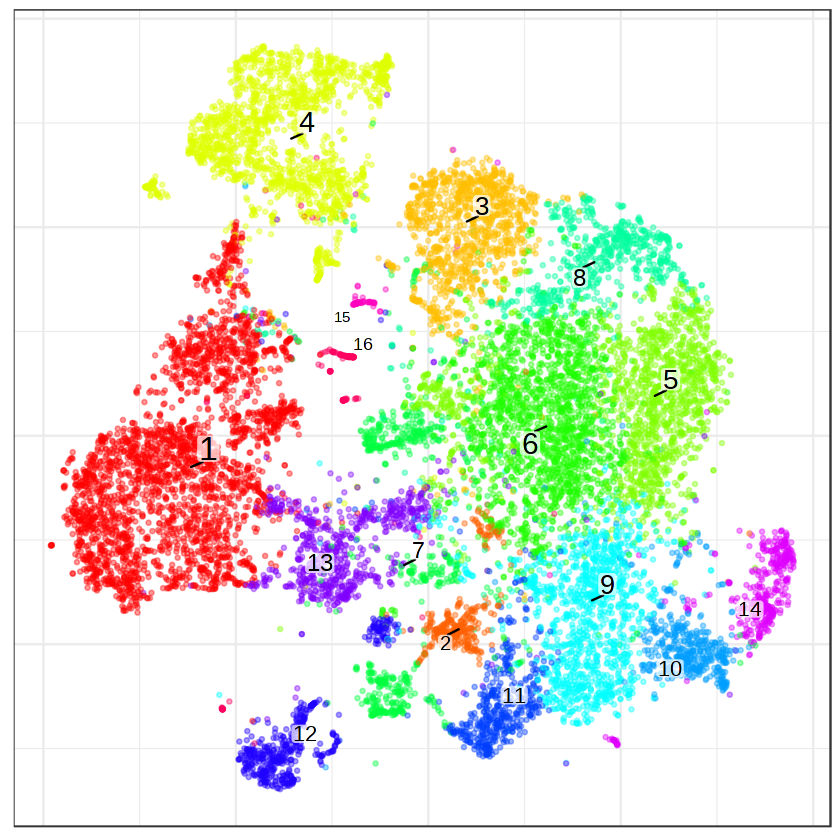

In [164]:
p2$plotEmbedding()

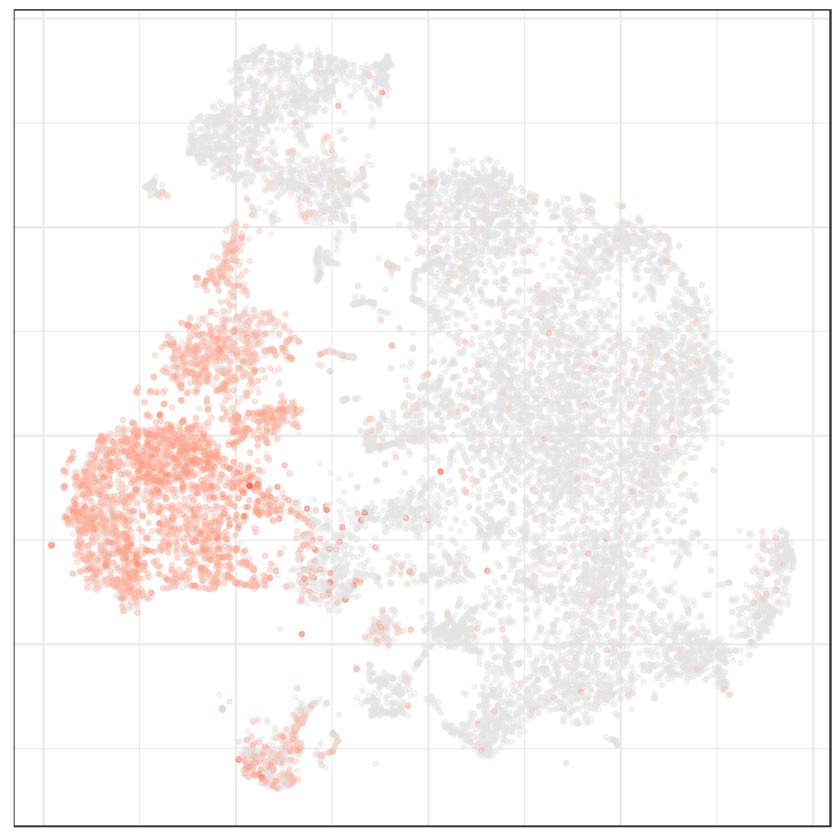

In [165]:
p2$plotEmbedding(gene = 'PAX5')

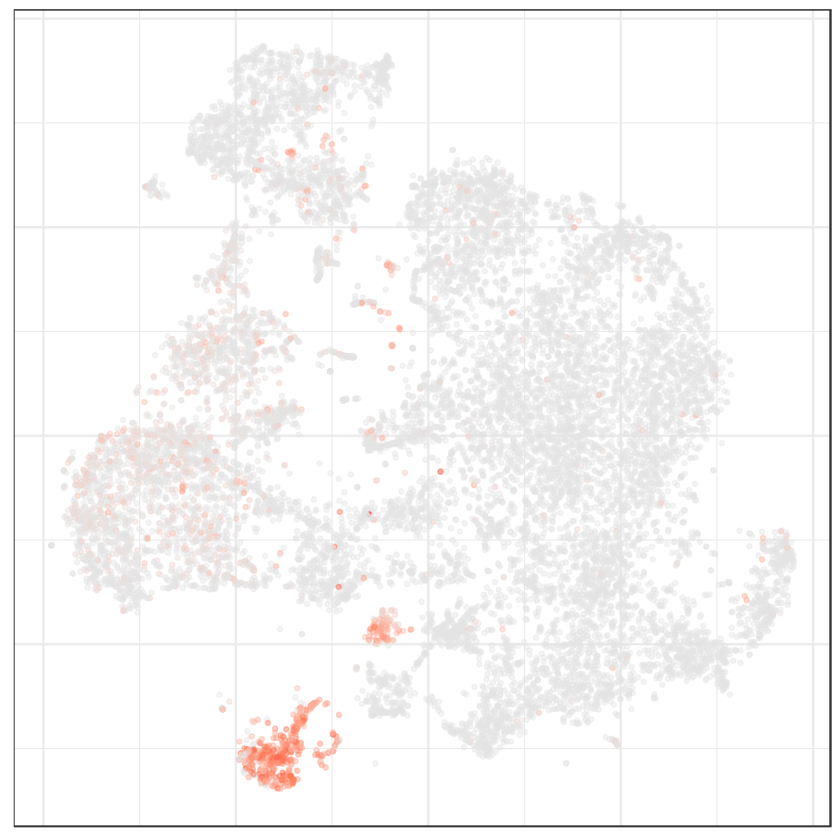

In [168]:
p2$plotEmbedding(gene = 'BANK1')

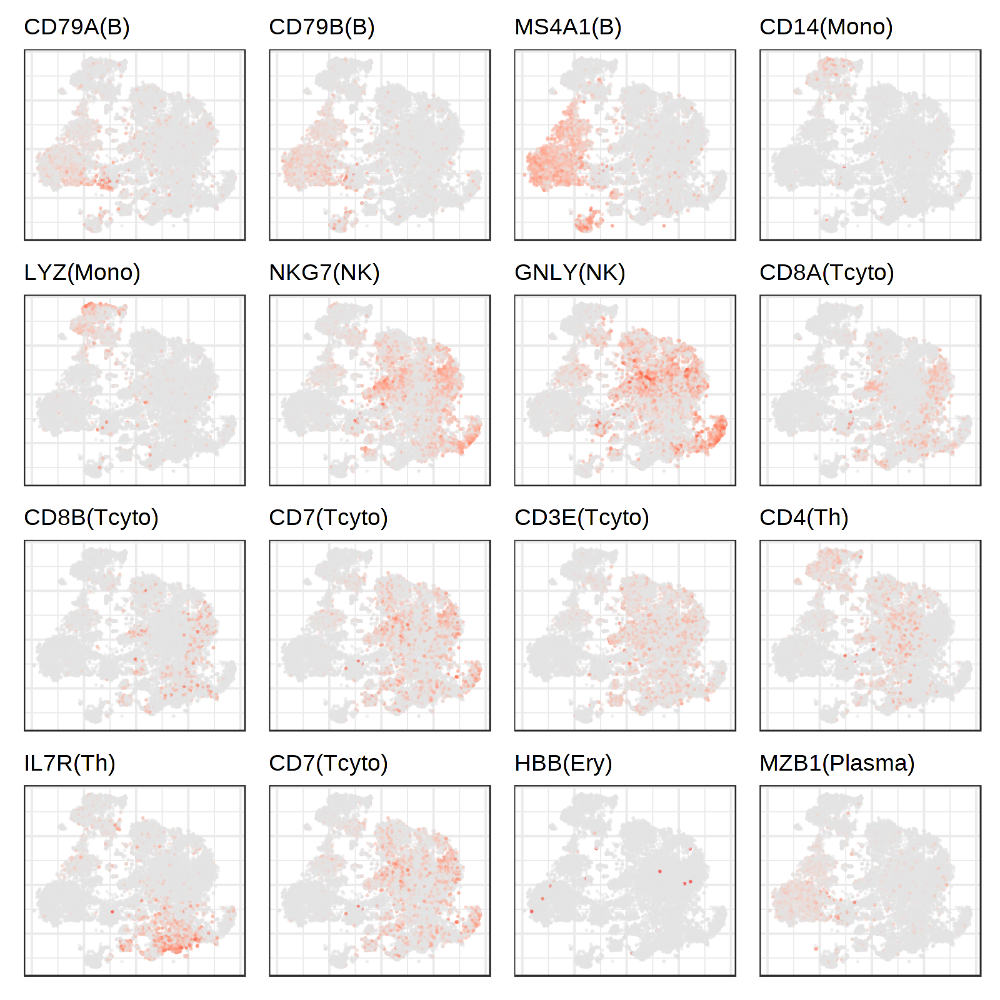

In [297]:
options(repr.plot.width = 8, repr.plot.height = 8, repr.plot.res = 200)

markers = c(
    'CD79A' = 'B', 'CD79B' = 'B', 'MS4A1' = 'B',
    'CD14' = 'Mono', 'LYZ' = 'Mono',
    'NKG7' = 'NK', 'GNLY' = 'NK',
    'CD8A' = 'Tcyto', 'CD8B' = 'Tcyto',
    'CD7' = 'Tcyto', 'CD3E' = 'Tcyto',
    'CD4' = 'Th', 'IL7R' = 'Th', 'CD7' = 'Th',
    'HBB' = 'Ery', 'MZB1' = 'Plasma'
)

lapply(
    names(markers),
    function(gene) {
        p2$plotEmbedding(size=0.1, gene = gene, title = paste0(gene, '(', markers[gene], ')'))}
) %>% 
wrap_plots()

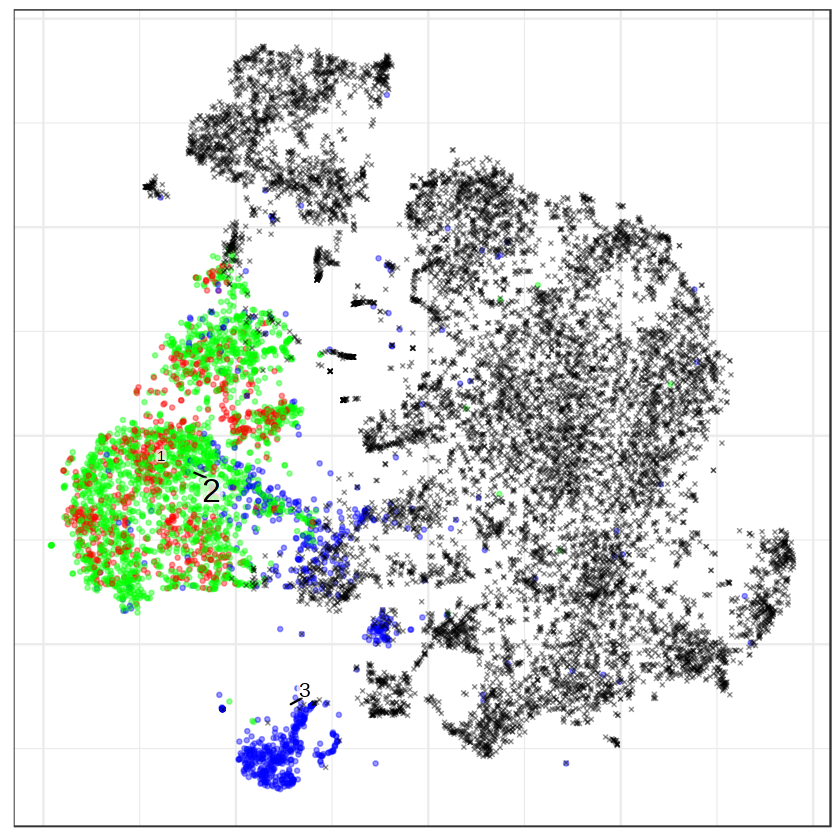

In [167]:
p2$plotEmbedding(
    groups = cutree(clust$hc, k = 3)
)

In [ ]:
clusters = p2$clusters$PCA$multilevel
saveRDS(clusters, 'p2_clusters.rds')
bcells = clusters[clusters %in% c(1,12)] %>% names

In [162]:
sc_refs = choose_ref_cor(count_mat[,bcells], lambdas_ref[,'B',drop=F], gtf_transcript)

In [305]:
# library(copykat)
# setwd('~/external/multiome')
# genes = unique(rownames(count_mat)[rownames(count_mat) %in% gtf_transcript$gene])
# res = copykat(
#     rawmat=count_mat[genes, bcells], 
#     id.type="S",
#     ngene.chr=0, 
#     win.size=25,
#     KS.cut=0.1, 
#     sam.name="test", 
#     distance="euclidean", 
#     norm.cell.names="", 
#     output.seg="FLASE", 
#     n.cores=30,
#     genome = 'hg20'
# )

In [57]:
count_mat_all = count_mat

In [61]:
hc = hclust(dist_mat, method = "ward.D2")

In [89]:
clust = exp_hclust(
    count_mat[,bcells],
    ref_hca[,c('B', 'Plasma'),drop=F],
    gtf_hg38,
    ncores = 30
)

Fitted reference proportions:

B:1,Plasma:0.0038

number of genes left: 7911

running hclust...



# Numbat

In [544]:
devtools::load_all('~/numbat')

ℹ Loading numbat



In [61]:
nb = Numbat$new(out_dir = '~/numbat_test', i = 2)

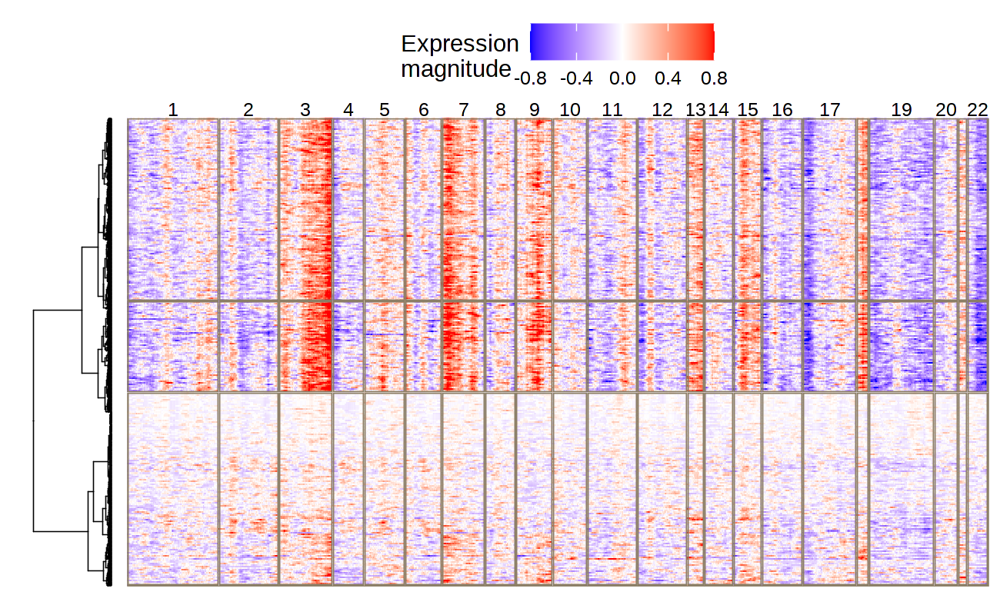

In [404]:
options(repr.plot.width = 6.5, repr.plot.height = 4, repr.plot.res = 200)

nb$plot_exp_roll()

In [71]:
devtools::load_all('~/numbat')

ℹ Loading numbat

Warning message:
“replacing previous import ‘Matrix::expand’ by ‘ggtree::expand’ when loading ‘numbat’”


In [62]:
nb$gtree = annot_superclones(nb$gtree, nb$geno)

In [70]:
score_mut(nb$gtree, nb$geno)

site,node,name,p,TP,FP,precision
<chr>,<int>,<chr>,<dbl>,<int>,<int>,<dbl>
18b,32,Node124,0.8558745,1885,0,1.0000000
3d,32,Node124,0.9669574,2750,0,1.0000000
7a,32,Node124,0.9175556,2608,0,1.0000000
9b,32,Node124,0.8199489,1242,0,1.0000000
9d,32,Node124,0.8997285,2230,0,1.0000000
3c,43,Node52,0.8448216,1933,22,0.9887468
15c,43,Node52,0.7970123,1523,29,0.9813144
3b,43,Node52,0.8228717,1769,47,0.9741189
17a,43,Node52,0.7687644,1220,35,0.9721116


In [66]:
score_mut(nb$gtree, nb$geno)

site,node,name,p,TP,FP,precision
<chr>,<int>,<chr>,<dbl>,<int>,<int>,<dbl>
18b,32,Node124,0.7964805,1885,4,0.9978825
9d,32,Node124,0.8314285,2230,9,0.9959803
3d,32,Node124,0.8739652,2750,16,0.9942155
7a,32,Node124,0.8728439,2608,16,0.9939024
9b,32,Node124,0.7394702,1242,8,0.9936000
3c,43,Node52,0.8276446,1933,26,0.9867279
15c,43,Node52,0.7699496,1523,39,0.9750320
3b,43,Node52,0.7987030,1769,52,0.9714443
17a,43,Node52,0.7338800,1220,36,0.9713376


Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


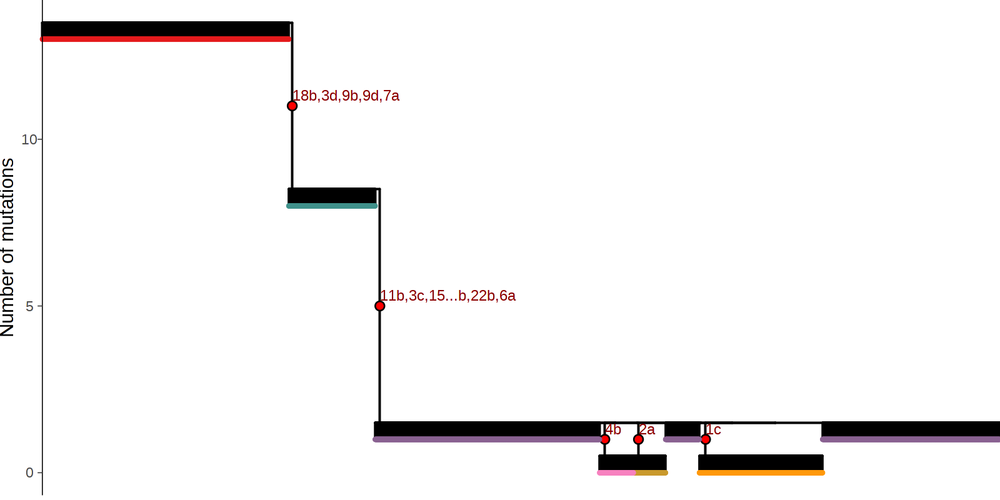

In [68]:
nb$gtree %>% plot_sc_tree()

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


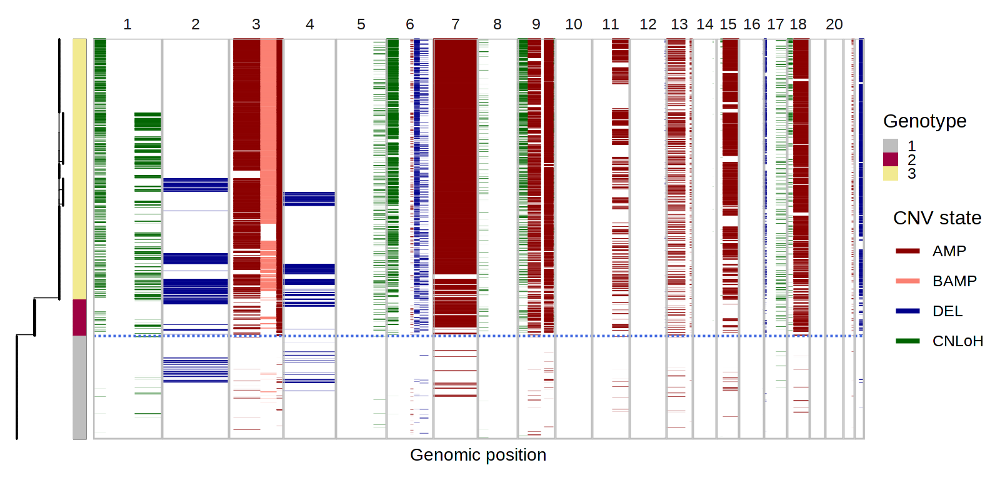

In [65]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 200)

plot_phylo_heatmap(
    nb$gtree, 
    nb$joint_post,
    nb$segs_consensus,
#     annot = cell_annot %>% {setNames(.$cell_type , .$cell)},
    geno_bar = T,
    superclone = T
)

In [525]:
bulks = nb$bulk_clones %>% annot_consensus(nb$segs_consensus)

In [528]:
bulks2 = bulks %>% run_group_hmms(run_hmm = F)

In [545]:
bulk = bulks %>%
    filter(sample == 3) %>%
    analyze_bulk(
        find_diploid = FALSE, 
        run_hmm = FALSE,
        allele_only = FALSE, 
        diploid_chroms = NULL,
        retest = TRUE, 
        verbose = TRUE
    )

Retesting CNVs..

Finishing..



In [547]:
bulk %>% filter(CHROM == 7) %>% distinct(LLR, seg)

seg,LLR
<fct>,<dbl>
7a,1065.752


In [531]:
bulks2 %>% filter(CHROM == 7) %>% distinct(LLR, LLR_x, LLR_y, seg)

seg,LLR_x,LLR_y,LLR
<fct>,<dbl>,<dbl>,<dbl>
7a,NA,NA,NA


Warning message:
“Removed 21 rows containing missing values (geom_segment).”


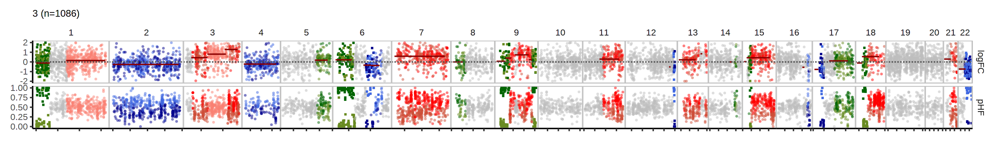

In [604]:
options(repr.plot.width = 14, repr.plot.height = 2, repr.plot.res = 200)

bulk %>%
plot_bulks(min_depth = 15)

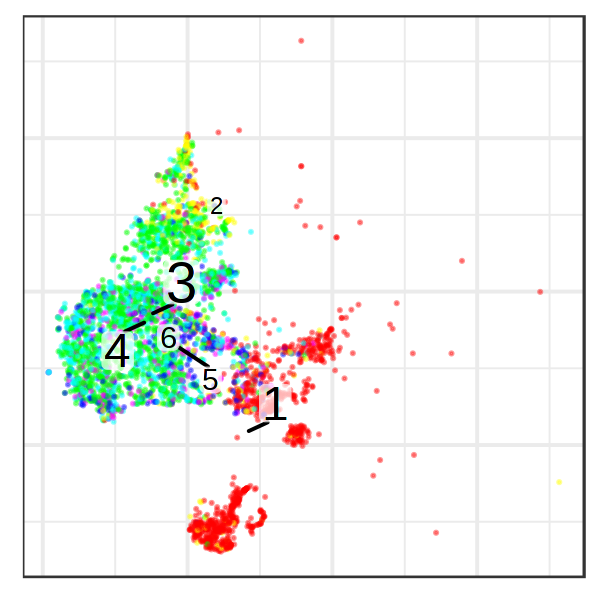

In [614]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 200)

p2$plotEmbedding(
    groups = nb$clone_post %>% {setNames(.$clone_opt, .$cell)},
    size = 0.1,
    plot.na = F
)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



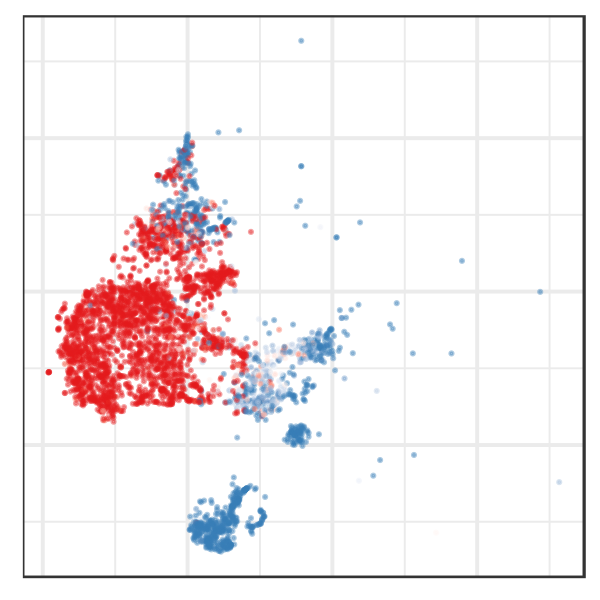

In [553]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 200)

p2$plotEmbedding(
    colors = nb$joint_post %>% group_by(cell) %>% summarise(logBF = sum(logBF)) %>% {setNames(.$logBF, .$cell)},
    size = 0.1,
    plot.na = F
) +
scale_color_gradient2(low = pal[2], high = pal[1], midpoint = 0, limits = c(-10,10), oob = scales::oob_squish)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



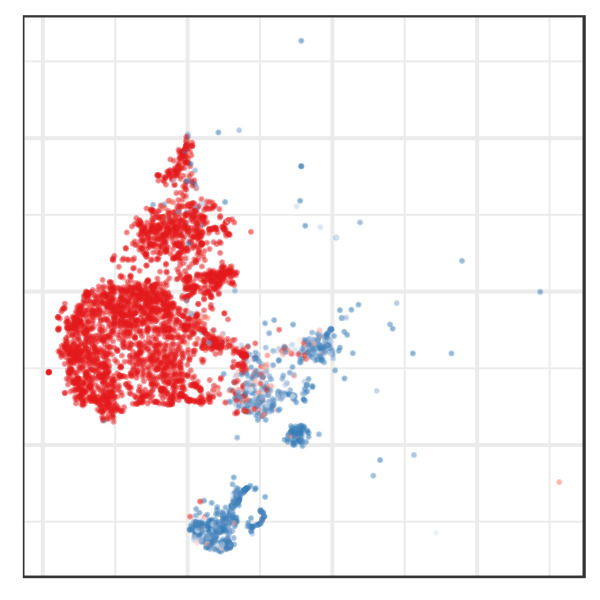

In [513]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 200)

p2$plotEmbedding(
    colors = nb$clone_post %>% {setNames(.$p_cnv, .$cell)},
    size = 0.1,
    plot.na = F
) +
scale_color_gradient2(low = pal[2], high = pal[1], midpoint = 0.5, limits = c(0,1), oob = scales::oob_squish)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



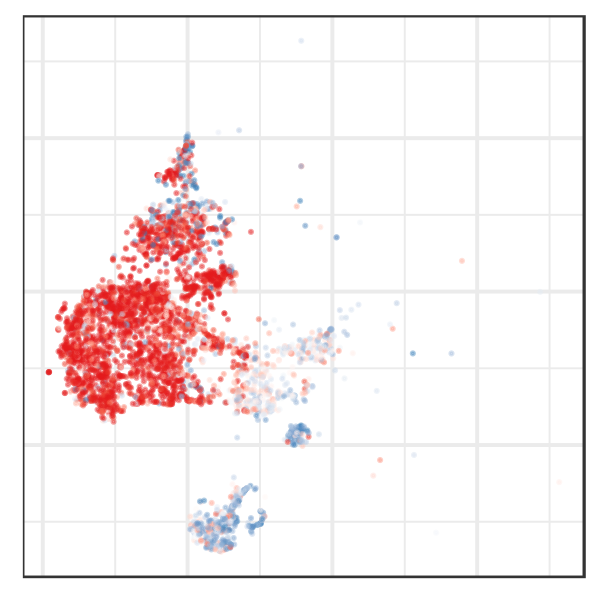

In [514]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 200)

p2$plotEmbedding(
    colors = nb$clone_post %>% {setNames(.$p_cnv_y, .$cell)},
    size = 0.1,
    plot.na = F
) +
scale_color_gradient2(low = pal[2], high = pal[1], midpoint = 0.5, limits = c(0,1), oob = scales::oob_squish)

In [438]:
ref_internal %>% saveRDS('~/external/multiome/ref_clusters.rds')

In [437]:
cell_annot = data.frame(cell = names(clusters), cell_type = clusters)
ref_internal = aggregate_counts(count_mat = count_mat_tr, cell_annot)$exp_mat

cell_dict
   1    2    3    4    5    6    7    8    9   10   11   12   13   14   15   16 
2916  313 1104 1719 1429 1795  659  684 1241  469  485  504  714  399   64  150 


In [419]:
devtools::load_all('~/numbat')

ℹ Loading numbat



In [420]:
cluster = 9

cells = cell_annot %>% filter(cell_type == cluster) %>% pull(cell)

bulk = get_bulk(
    count_mat = count_mat_tr[,cells],
    lambdas_ref = ref_internal[,colnames(ref_internal) != cluster],
    df_allele = df %>% filter(cell %in% cells),
    gtf_transcript = gtf_hg38,
    genetic_map = genetic_map_hg38
)

Fitted reference proportions:

2:0.00081,3:0.0032,4:0.00081,5:0.034,6:0.88,7:0.0056,8:0.00081,10:0.028,11:0.042,14:0,15:0.00081,16:0

number of genes left: 11320



In [429]:
bulk = bulk %>% analyze_bulk(retest = T)

Retesting CNVs..

Finishing..



In [426]:
segs = bulk %>% 
            distinct(CHROM, seg, seg_start, seg_start_index, seg_end, seg_end_index, phi_mle, cnv_state) %>%
            mutate(variable = 'logFC')

In [389]:
segs_post = retest_cnv(bulk, gamma = gamma, exp_model = 'lnpois', allele_only = F)

Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


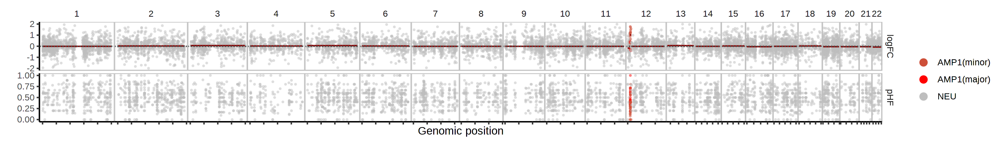

In [434]:
options(repr.plot.width = 14, repr.plot.height = 2, repr.plot.res = 200)

bulk %>% plot_psbulk(min_depth = 5, min_LLR = 0, use_pos = T)

In [439]:
cells = cell_annot %>% filter(cell_type == 1) %>% pull(cell)

bulk_tumor = get_bulk(
    count_mat = count_mat_tr[,cells],
    lambdas_ref = ref_internal[,'12',drop=F],
    df_allele = df %>% filter(cell %in% cells),
    gtf_transcript = gtf_hg38,
    genetic_map = genetic_map_hg38
)

Fitted reference proportions:

12:1

number of genes left: 11257



In [442]:
bulk_tumor = bulk_tumor %>% analyze_bulk()

Retesting CNVs..

Finishing..



Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


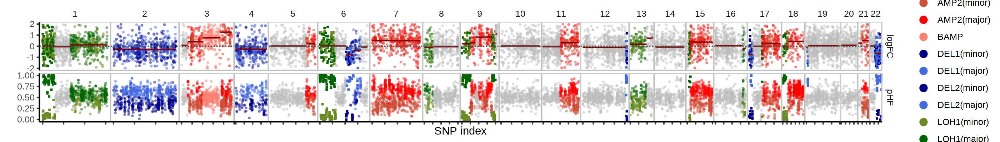

In [605]:
options(repr.plot.width = 12, repr.plot.height = 2, repr.plot.res = 200)

bulk_tumor %>% plot_bulks(min_depth = 25, min_LLR = 50, use_pos = F)

# ATAC

In [582]:
ref_atac = aggregate_counts(
    count_mat_atac,
    data.frame(
        cell = colnames(count_mat_atac)
    ) %>%
    mutate(cell_type = ifelse(cell %in% bcells, 'B', 'other'))
)

cell_dict
    B other 
 3420 11225 


In [629]:
normal_bcells = names(clusters[clusters == 12])

ref_bcells = aggregate_counts(
    count_mat_atac,
    data.frame(
        cell = colnames(count_mat_atac)
    ) %>%
    filter(cell %in% normal_bcells) %>%
    mutate(cell_type = "B")
)$exp_mat

cell_dict
  B 
504 


In [631]:
clust_atac = exp_hclust(
    count_mat = count_mat_atac[,bcells[!bcells %in% normal_bcells]],
    lambdas_ref = ref_bcells,
    gtf_transcript = gtf_atac %>% rename(gene = peak_id, gene_start = start, gene_end = end),
    ncores = 30,
    window = 201
)

Fitted reference proportions:

B:1

number of genes left: 37142

running hclust...



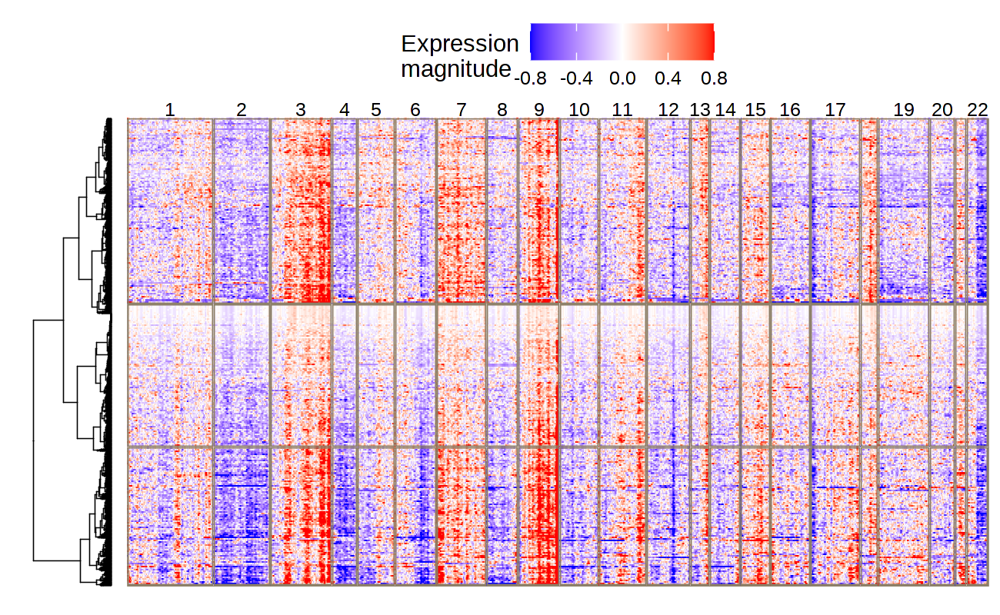

In [632]:
options(repr.plot.width = 6.5, repr.plot.height = 4, repr.plot.res = 200)

plot_sc_roll(
    gexp_roll_wide = clust_atac$gexp_roll_wide %>% as.data.frame() %>% tibble::rownames_to_column('cell'),
    hc = clust_atac$hc,
    gtf_transcript = gtf_atac %>% rename(gene = peak_id, gene_start = start, gene_end = end),
    k = 3,
    n_sample = 300
)

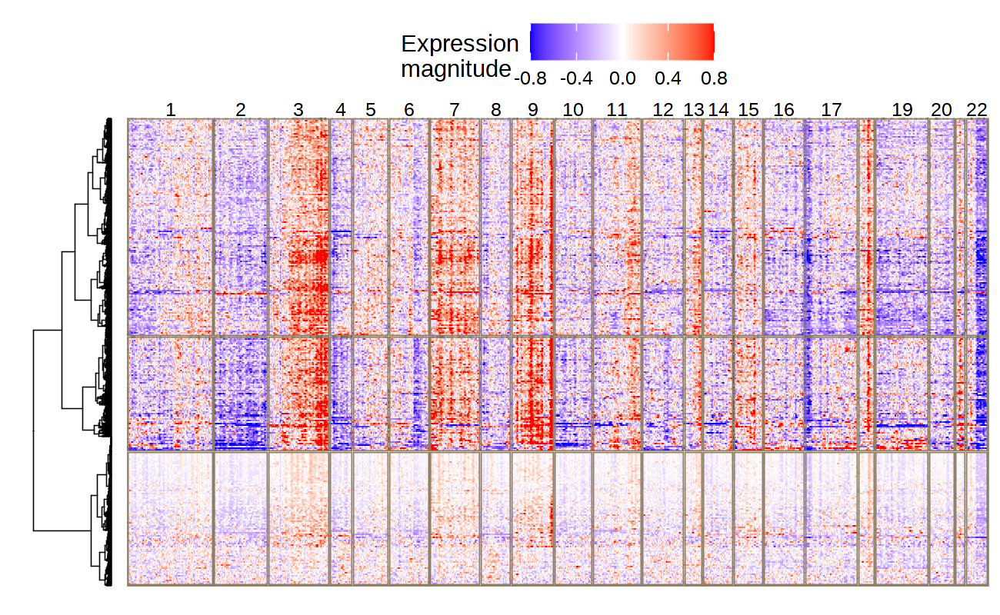

In [603]:
options(repr.plot.width = 6.5, repr.plot.height = 4, repr.plot.res = 200)

plot_sc_roll(
    gexp_roll_wide = clust_atac$gexp_roll_wide %>% as.data.frame() %>% tibble::rownames_to_column('cell'),
    hc = clust_atac$hc,
    gtf_transcript = gtf_atac %>% rename(gene = peak_id, gene_start = start, gene_end = end),
    k = 3,
    n_sample = 300
)

In [645]:
gexp_norm_long = process_exp_sc(
    count_mat = count_mat_atac[,bcells[!bcells %in% normal_bcells]],
    lambdas_ref = ref_bcells[,'B'],
    gtf_transcript = gtf_atac %>% rename(gene = peak_id, gene_start = start, gene_end = end),
    window = 201,
    verbose = T
)

number of genes left: 37142



In [706]:
chrom_sizes = fread('~/ref/hg38.chrom.sizes.txt') %>% setNames(c('CHROM', 'length')) %>%
    mutate(CHROM = str_remove(CHROM, 'chr')) %>%
    filter(CHROM %in% 1:22) %>%
    mutate(CHROM = as.integer(CHROM))

In [736]:
set.seed(0)

chroms = c(18, 21, 22)

D = gexp_norm_long %>%
    filter(cell %in% sample(unique(cell), 50)) %>%
    filter(CHROM %in% chroms) %>%
    mutate(gene_start = as.integer(gene_start))

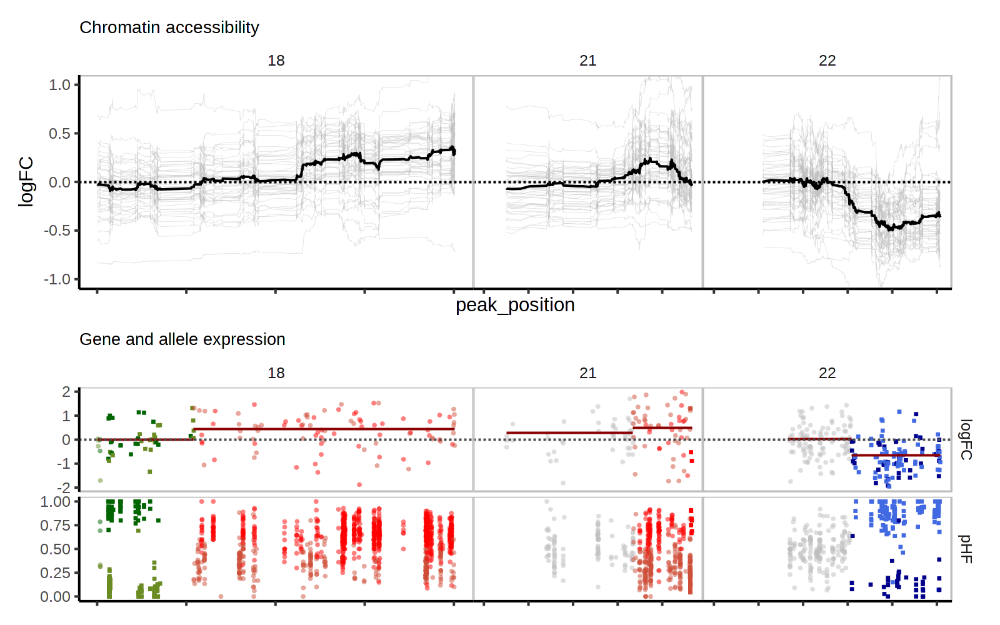

In [739]:
options(repr.plot.width = 8, repr.plot.height = 5, repr.plot.res = 200)

p1 = D %>%
    ggplot(
        aes(x = gene_start, y = exp_rollmean, group = cell)
    ) +
    geom_line(color = 'gray', alpha = 0.5, size = 0.1) +
    geom_line(
        data = D %>% group_by(CHROM, gene, gene_start) %>%
            summarise(
                exp_rollmean = median(exp_rollmean),
                .groups = 'drop'
            ) %>%
            mutate(cell = 'avg')
    ) +
    geom_segment(
        inherit.aes = F,
        data = chrom_sizes %>% filter(CHROM %in% D$CHROM),
        aes(x = 0, xend = length, y = 0, yend = 0),
        alpha = 0
    ) +
    theme_classic() +
    theme(
        panel.spacing.x = unit(0, 'mm'),
        panel.spacing.y = unit(1, 'mm'),
        panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
        strip.background = element_blank(),
        axis.text.x = element_blank(),
        plot.title = element_text(size = 10)
    ) +
    facet_grid(~CHROM, scale = 'free', space = 'free_x') +
    ylab('logFC') +
    coord_cartesian(ylim = c(-1,1)) +
    geom_hline(yintercept = 0, linetype = 'dashed') +
    xlab('peak_position') +
    ggtitle('Chromatin accessibility')

p2 = bulk_tumor %>%
    filter(CHROM %in% chroms) %>%
    mutate(CHROM = as.integer(CHROM)) %>%
    plot_bulks(min_depth = 10, use_pos = T) +
    geom_segment(
        inherit.aes = F,
        data = chrom_sizes %>% filter(CHROM %in% D$CHROM),
        aes(x = 0, xend = length, y = 0, yend = 0),
        alpha = 0
    ) +
    ggtitle('Gene and allele expression')

p1/p2